# Getting our workspace ready

In [ ]:
# !unzip "/content/drive/MyDrive/ML_course/dog-breed-identification.zip" -d "/content/drive/MyDrive/ML_course/"

In [ ]:
import tensorflow as tf
print("tensorflow version:", tf.__version__)

tensorflow version: 2.7.0


In [ ]:
import tensorflow_hub as hub
print("tensorflow_hub version:", hub.__version__)

tensorflow_hub version: 0.12.0


In [ ]:
# Check if GPU is available
print("GPU available") if tf.config.list_physical_devices("GPU") else print("No GPU available")

GPU available


## Getting our data ready (turning into tensors - numerical representation)

In [ ]:
# Chekout the labels of our Data
import pandas as pd
labels_csv = pd.read_csv("labels.csv")

In [ ]:
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     9c4f3a8d5d506f5f368de386a3015c81  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
brabancon_griffon        67
golden_retriever         67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

85.18333333333334
82.0


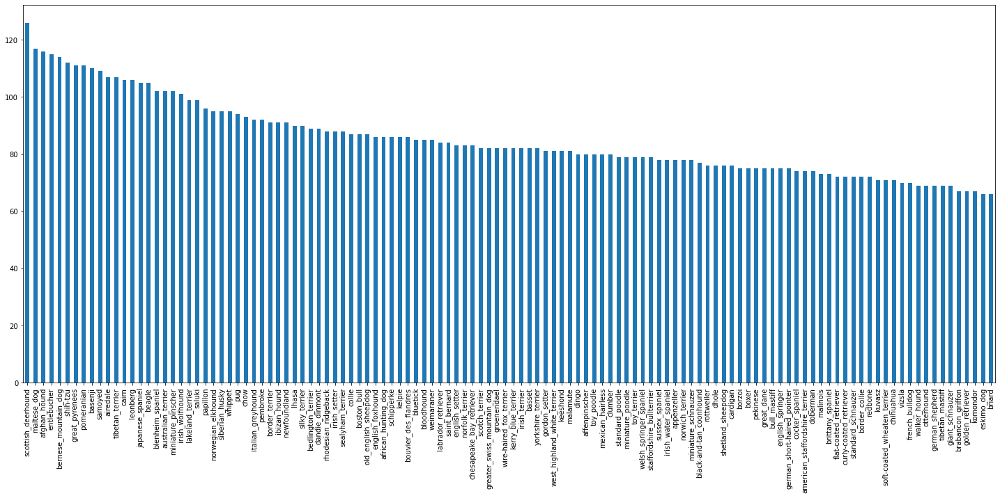

In [ ]:
# Visualization of how many breeds
labels_csv["breed"].value_counts().plot.bar(figsize=(25,10))
print(labels_csv["breed"].value_counts().mean())
print(labels_csv["breed"].value_counts().median())

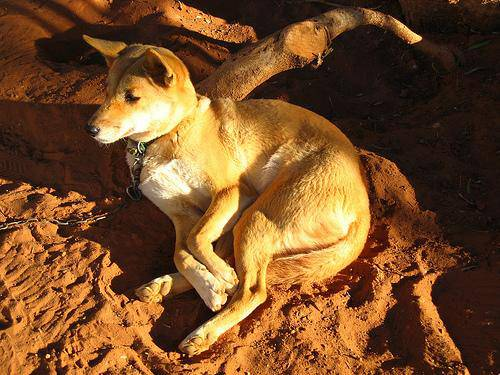

In [ ]:
# Let's view an image
from IPython.display import Image, display
Image('train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting images and ther labels


In [ ]:
 # Create pathnames from image ID's
filenames = [f"train/{fname}.jpg" for fname in labels_csv['id']]

filenames[:10]

['drive/MyDrive/ML_course/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/ML_course/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/ML_course/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/ML_course/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/ML_course/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/ML_course/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/ML_course/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/ML_course/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/ML_course/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/ML_course/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("train/")) == len(filenames):
  print("OK")

OK


malamute


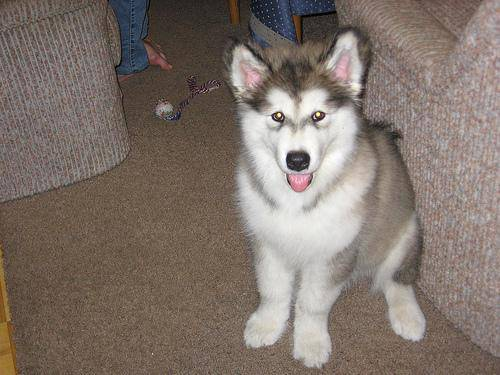

In [ ]:
# Check an image directly from a filepath
print(labels_csv['breed'][3000])
Image(filenames[3000])

In [ ]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn labels into arrays of booleans
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:3]


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example: Turning a boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])[0][0]) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Create our own validation set 

In [ ]:
# Setup X & y vaiables
X = filenames
y = boolean_labels


In [ ]:
len(filenames), len(y)

(10222, 10222)

Let's start only with 1000 images

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Import train_test_split from scikit-learn
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
X_train[:5], y_train[:2]

(['drive/MyDrive/ML_course/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/ML_course/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/ML_course/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/ML_course/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/ML_course/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False

### Preprocessing images

In [ ]:
# Convert imagen into Numpy Array
from matplotlib.pyplot import imread
image = imread(filenames[2000])
image.shape

(500, 375, 3)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 375, 3), dtype=uint8, numpy=
array([[[31, 36, 30],
        [28, 33, 27],
        [23, 28, 22],
        ...,
        [51, 57, 31],
        [73, 80, 47],
        [39, 46, 12]],

       [[28, 33, 27],
        [25, 30, 24],
        [21, 26, 20],
        ...,
        [52, 58, 32],
        [63, 70, 37],
        [31, 38,  4]]], dtype=uint8)>

In [ ]:
# Define image size
IMG_SIZE = 224 #@param

def process_image(image_path):
  """
  Takes an image file path and tuns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)

  # Turns the Jpeg into a numerical tensor with 3 colour channels (Red, Green, Blue)
  image= tf.image.decode_jpeg(image, channels=3)

  # Convert the colour channel values from 0-255 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resizes the image to our desired size (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  
  return image



### Create data Batches

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label (image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size = BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    return data.map(process_image).batch(BATCH_SIZE)
  elif valid_data:
    print('Creating validation data batches... ')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),  #filepaths
                                               tf.constant(y))) #labels
    return data.map(get_image_label).batch(BATCH_SIZE)
  else:
    # If the data is a training dataset, we shuffle it
    print('Creating training data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),   #filepaths
                                               tf.constant(y)))  #labels
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

     # Create (image, label) tuples (this also turns the image path into a preprocessed image) ans then Batch the data
    return data.map(get_image_label).batch(BATCH_SIZE)

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches... 


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, train_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualization DATA BAtches

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
    
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax=plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis('off')

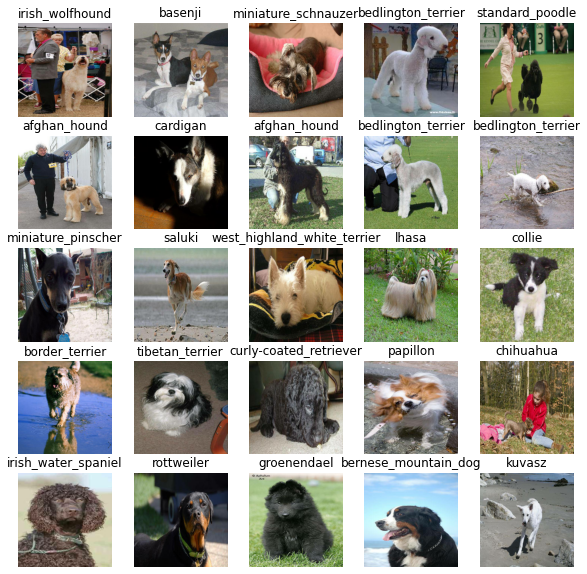

In [ ]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

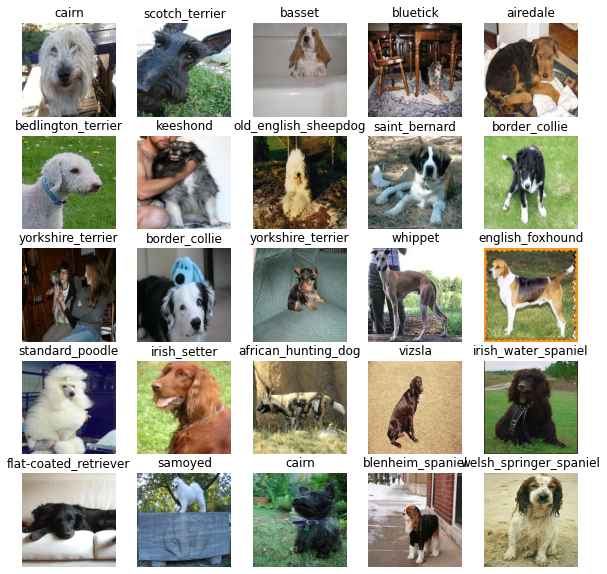

In [ ]:
# Visualize validation images from the validation data batch
valid_images, valid_labels = next(valid_data.as_numpy_iterator())
show_25_images(valid_images, valid_labels)

### Creating and training a model


In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
# Create a function which builds a keras model
def create_model(input=INPUT_SHAPE, output=OUTPUT_SHAPE, model_url=URL):
  print(f'Building model with: {URL}')

  # setup the model layers 
  model = tf.keras.Sequential([hub.KerasLayer(URL), # layer1 (input layer)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                                                     activation='softmax')]) # layer 2 (output layer)
  # compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # our model wants to reduce this (how wrong its guesses are)
      optimizer = tf.keras.optimizers.Adam(), #  A friend telling our model how to improve its guesses
      metrics=['accuracy'])

  # build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model
  


### Callbacks

In [ ]:
# tensorboard callbacks
%load_ext tensorboard
import datetime
def create_tensorboard_callback():
  logdir = os.path.join('/logs',
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)


In [ ]:
# Early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

### TRAINING OUR MODEL

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [ ]:
if tf.config.list_logical_devices('GPU'):
  print('Yessssss')

Yessssss


In [ ]:
def train_model():
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
model= train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 128s 3s/step - loss: 4.6163 - accuracy: 0.0775 - val_loss: 3.5588 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 4s 160ms/step - loss: 1.6511 - accuracy: 0.6837 - val_loss: 2.2837 - val_accuracy: 0.4500
Epoch 3/100
25/25 [==============================] - 3s 135ms/step - loss: 0.5683 - accuracy: 0.9375 - val_loss: 1.8065 - val_accuracy: 0.5150
Epoch 4/100
25/25 [==============================] - 4s 165ms/step - loss: 0.2579 - accuracy: 0.9862 - val_loss: 1.6035 - val_accuracy: 0.5950
Epoch 5/100
25/25 [==============================] - 4s 142ms/step - loss: 0.1471 - accuracy: 0.9987 - val_loss: 1.5018 - val_accuracy: 0.5900
Epoch 6/100
25/25 [==============================] - 4s 165ms/step - loss: 0.1009 - accuracy: 1.0000 - val_loss: 1.4433 - val_accuracy: 0.6200
Epoch 7/100
25/25 [==============================]

In [ ]:
%tensorboard --logdir /logs

Output hidden; open in https://colab.research.google.com to view.

# Making and evaluating predictions using a trained model

In [ ]:
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 3s 119ms/step


array([[2.4483274e-03, 1.3774705e-04, 9.3129778e-04, ..., 2.3267095e-04,
        5.5662858e-05, 5.1072976e-03],
       [1.5671304e-03, 4.6295670e-04, 1.7223071e-03, ..., 8.3357166e-04,
        1.3622382e-03, 6.6954712e-04],
       [7.9689475e-05, 1.9225549e-04, 6.0683786e-04, ..., 5.1177153e-04,
        1.2304996e-04, 2.6867000e-04],
       ...,
       [6.9230231e-07, 2.8456177e-05, 2.0344802e-05, ..., 7.3808644e-07,
        7.7757768e-06, 1.9397950e-05],
       [2.7502461e-03, 7.8973646e-04, 4.5940693e-04, ..., 5.6445028e-04,
        9.4518444e-05, 4.1292245e-03],
       [2.3162703e-04, 4.3717315e-05, 2.9148880e-04, ..., 2.2754460e-03,
        1.2018657e-04, 1.4565818e-04]], dtype=float32)

In [ ]:
predictions[0]

array([2.44832737e-03, 1.37747047e-04, 9.31297778e-04, 3.46363260e-04,
       2.01013405e-04, 4.69820225e-05, 9.19776112e-02, 1.93753367e-04,
       1.16643256e-04, 7.51994143e-04, 3.18367762e-04, 4.77539797e-05,
       1.28112253e-04, 2.23579864e-05, 1.64918092e-04, 7.53325585e-05,
       1.03242375e-04, 1.76744863e-01, 2.87469084e-05, 2.96895450e-04,
       9.52452247e-04, 1.99880204e-04, 4.88434125e-05, 2.61719152e-03,
       9.67983651e-05, 1.93000378e-04, 1.43606514e-01, 1.13822738e-04,
       2.76839419e-04, 2.11580860e-04, 7.10458844e-05, 3.19884741e-03,
       1.27176347e-04, 7.23292906e-05, 1.85324636e-04, 5.52739203e-03,
       3.09273200e-05, 5.06181852e-04, 6.03570952e-05, 3.60133185e-04,
       2.62250949e-04, 2.98218401e-05, 7.41156764e-05, 3.27203197e-05,
       7.50659237e-05, 1.41055454e-04, 2.21131722e-05, 5.46159456e-04,
       1.04740984e-03, 2.23372001e-04, 5.28660457e-05, 1.02356662e-05,
       1.06003376e-04, 2.99398322e-04, 3.64495092e-04, 3.73038492e-04,
      

In [ ]:
np.max(predictions[0])

0.17674486

In [ ]:
unique_breeds[np.argmax(predictions[0])]

'border_terrier'

In [ ]:
def get_pred_label(predict):
  return unique_breeds[np.argmax(predict)]

In [ ]:
get_pred_label(predictions[121])

'cardigan'

In [ ]:
def unbatchify(data):
  images=[]
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels 

In [ ]:
val_image, val_label = unbatchify(valid_data)

In [ ]:
#val_image[0], 
unique_breeds[np.argmax(val_label[121])]

'affenpinscher'

In [ ]:
def plot_pred(predictions_probabilities, labels, images, n=1):
  pred_prob, true_label, image = predictions_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  color = 'green' if pred_label == true_label else 'red'
  plt.title('{} {:2.0f}% {}'.format(pred_label, np.max(pred_prob)*100, true_label),
                                    color=color)

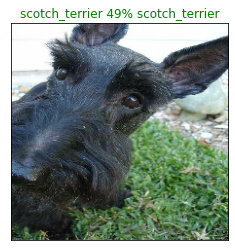

In [ ]:
plot_pred(predictions, val_label,val_image,n=1)

In [ ]:
def plot_pred_conf(pred_probabilities, labels, n=1):
  pred_prob, true_label = pred_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot=plt.bar(np.arange(10),
                   top_10_pred_values,
                   color='grey')
  plt.xticks(np.arange(10),
             labels= top_10_pred_labels,
             rotation='vertical')
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')  

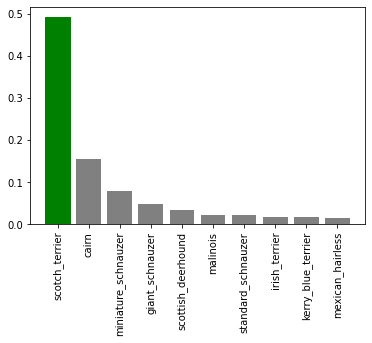

In [ ]:
plot_pred_conf(predictions, val_label)

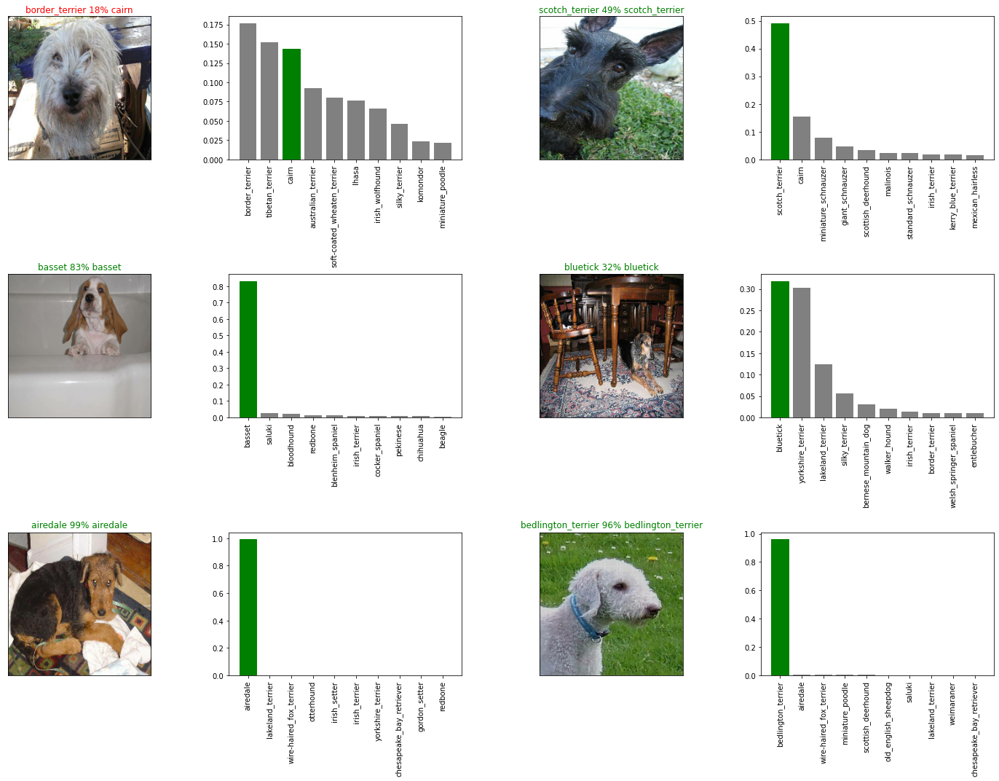

In [ ]:
i_multiplier=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols

plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, val_label, val_image, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_label, n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


# Saving and Reloading a model

In [ ]:
def save_model(model, suffix=None):
  modeldir=os.path.join('models',
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = f'{modeldir}-{suffix}.h5'
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  print(f'Loading model from: {model_path}...')
  return tf.keras.models.load_model(
      model_path, custom_objects={'KerasLayer': hub.KerasLayer})

In [ ]:
# Save our model trained on 100 images
save_model(model, suffix="1000-images-Adam")

Saving model to: /content/drive/MyDrive/ML_course/models/20220119-11501642593042-1000-images-Adam.h5...


'/content/drive/MyDrive/ML_course/models/20220119-11501642593042-1000-images-Adam.h5'

In [ ]:
# Load our model trained on 1000 images
model_1000_images = load_model('models/20220119-11501642593042-1000-images-Adam.h5')

Loading model from: /content/drive/MyDrive/ML_course/models/20220119-11501642593042-1000-images-Adam.h5...


In [ ]:
# Evaluate the pre-saved model
model.evaluate(valid_data)


7/7 [==============================] - 1s 88ms/step - loss: 1.3303 - accuracy: 0.6450


[1.3302515745162964, 0.6449999809265137]

In [ ]:
# Evaluate the loaded model ----- se supoe que vai dar o mesmo
model_1000_images.evaluate(valid_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.3303 - accuracy: 0.6450


[1.3302515745162964, 0.6449999809265137]

# Training a model on a full data

In [ ]:
# Import train_test_split from scikit-learn
from sklearn.model_selection import train_test_split
X_f_train, X_f_val, y_f_train, y_f_val = train_test_split(X, y, test_size=0.2, random_state=42)
len(X_f_train), len(X_f_val), len(y_f_train), len(y_f_val)

(8177, 2045, 8177, 2045)

In [ ]:
# Create training and validation data batches
train_full_data = create_data_batches(X_f_train, y_f_train)
valid_full_data = create_data_batches(X_f_val, y_f_val, valid_data=True)

Creating training data batches...
Creating validation data batches... 


In [ ]:
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

# %tensorboard --logdir /logs

In [ ]:
full_model.fit(x=train_full_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_full_data,
            validation_freq=1,
            callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
256/256 [==============================] - 39s 135ms/step - loss: 1.5135 - accuracy: 0.6383 - val_loss: 0.6769 - val_accuracy: 0.8068
Epoch 2/100
256/256 [==============================] - 37s 144ms/step - loss: 0.4152 - accuracy: 0.8773 - val_loss: 0.6396 - val_accuracy: 0.8176
Epoch 3/100
256/256 [==============================] - 37s 144ms/step - loss: 0.2362 - accuracy: 0.9398 - val_loss: 0.6313 - val_accuracy: 0.8142
Epoch 4/100
256/256 [==============================] - 37s 143ms/step - loss: 0.1490 - accuracy: 0.9704 - val_loss: 0.6450 - val_accuracy: 0.8142
Epoch 5/100
256/256 [==============================] - 36s 142ms/step - loss: 0.0988 - accuracy: 0.9829 - val_loss: 0.6413 - val_accuracy: 0.8142
Epoch 6/100
256/256 [==============================] - 33s 128ms/step - loss: 0.0716 - accuracy: 0.9914 - val_loss: 0.6619 - val_accuracy: 0.8156
Epoch 7/100
256/256 [==============================] - 37s 145ms/step - loss: 0.0532 - accuracy: 0.9957 - val_loss: 0.6785 -

In [ ]:
# SAve new model
save_model(full_model, suffix='All_data_Adam')

Saving model to: /content/drive/MyDrive/ML_course/models/20220119-12401642596055-All_data_Adam.h5...


'/content/drive/MyDrive/ML_course/models/20220119-12401642596055-All_data_Adam.h5'

In [ ]:
loaded_f_model = load_model('models/20220119-12401642596055-All_data_Adam.h5')

Loading model from: /content/drive/MyDrive/ML_course/models/20220119-12401642596055-All_data_Adam.h5...


# Making predictions on the test data set

In [ ]:
import os
test_path = 'test/'
test_filenames =[test_path + fname for fname in os.listdir(test_path)]
test_data = create_data_batches(test_filenames, test_data=True)


Creating test data batches...


In [ ]:
test_predictions = loaded_f_model.predict(test_data, verbose=1)

324/324 [==============================] - 169s 479ms/step


In [ ]:
unique_breeds[np.argmax(test_predictions[0])]

'pug'

## Make predictions on costum dataset

In [ ]:
costum_path = 'my-images/'
costum_filenames =[costum_path + fname for fname in os.listdir(costum_path)]
costum_data = create_data_batches(costum_filenames, test_data=True)


Creating test data batches...


In [ ]:
costum_predictions=loaded_f_model.predict(costum_data,verbose=1)

1/1 [==============================] - 1s 1s/step


In [ ]:
unique_breeds[np.argmax(costum_predictions[1])]

'cardigan'

In [ ]:
costum_images = list(costum_data.unbatch().as_numpy_iterator())

In [ ]:
len(costum_images)

5

In [ ]:
def plot_pred_without_label (predictions_probabilities, images, n=1):
  pred_prob, image = predictions_probabilities[n], images[n]
  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  
  plt.title('{} {:2.0f}%'.format(pred_label,
                                    np.max(pred_prob)*100))


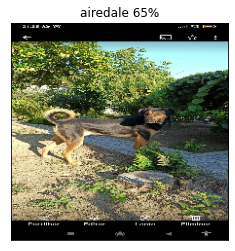

In [ ]:
plot_pred_without_label(costum_predictions, costum_images ,n=0)

In [ ]:
def plot_pred_without_label_conf(pred_probabilities, n=1):
  pred_prob = pred_probabilities[n]
  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot=plt.bar(np.arange(10),
                   top_10_pred_values,
                   color='grey')
  plt.xticks(np.arange(10),
             labels= top_10_pred_labels,
             rotation='vertical')
  
  

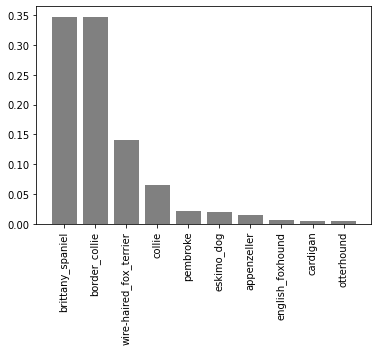

In [ ]:
plot_pred_without_label_conf(costum_predictions, n=2)

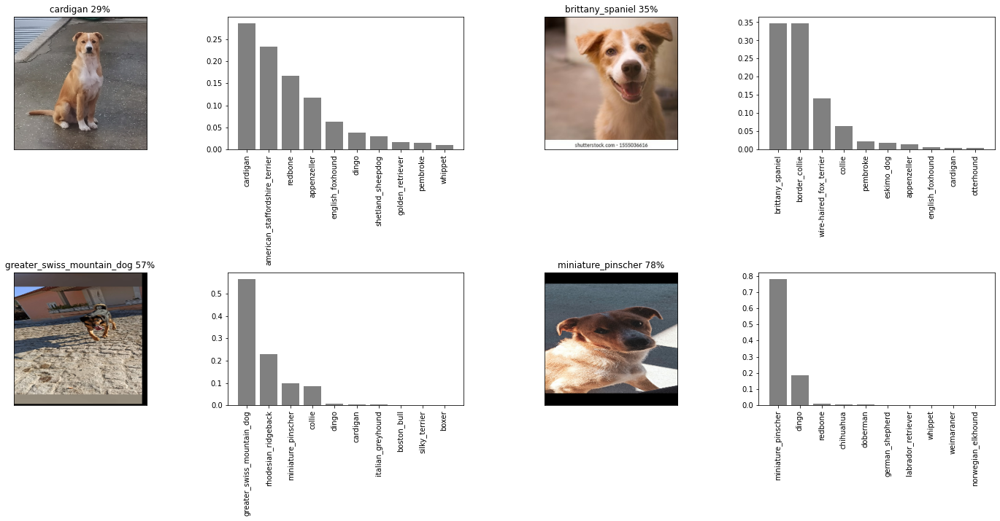

In [ ]:
i_multiplier=1
num_rows=2
num_cols=2
num_images=num_rows*num_cols

plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred_without_label(costum_predictions, costum_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_without_label_conf(costum_predictions, n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()